In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
import sys
import os
import glob
import numpy as np
import pandas as pd
import dask.dataframe as dd
import xarray as xr
import hvplot.xarray  # noqa
import seaborn as sns
from dask import delayed, compute
import itertools
from pytmatrix import tmatrix_aux, refractive, tmatrix, radar
from pymiecoated import Mie
from scipy.constants import c
from scipy import stats as ss
from sqlalchemy.exc import OperationalError
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
from re import split
import matplotlib.dates as mdates
from dask_jobqueue import SLURMCluster
from dask.distributed import Client, progress
import dask.dataframe as dd
from dask import delayed, compute
from metpy.calc import pressure_to_height_std as p2h
from metpy.calc import lcl
import cartopy.crs as ccrs
import cartopy
import cartopy.mpl.ticker as cticker
import cartopy.io.img_tiles as cimgt
import cartopy.feature as cfeature
import warnings
warnings.filterwarnings('ignore')



sys.path.insert(1, f"{os.path.abspath(os.path.join(os.path.abspath(''), '../'))}")
from src.utils import get_pars_from_ini, make_dir

location = split(', |_|-|!', os.popen('hostname').read())[0].replace("\n", "")
path_data = get_pars_from_ini(file_name='loc')[location]['path_data']

/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/data/keeling/a/alfonso8/miniconda3/envs/camp2ex_proj/lib/python3.9/site-packages/dask/dataframe/backends.py:181: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Floa

In [2]:
def pds_parameters(xr_data):
    """
    Compute the psd parameters
    :param xr_data: partice size distribution in # L-1 um-1
    :return: list with lwc, dm, nw, z, and r
    """
    xr_data['lwc_cum'] = xr_data.lwc.sum('diameter')
    xr_data['dbz_t'] = 10 * np.log10(xr_data.z.sum('diameter'))
    xr_data['dbz_t_ku'] = 10 * np.log10(xr_data.refl_ku.sum('diameter'))    
    xr_data['dbz_t_ka'] = 10 * np.log10(xr_data.refl_ka.sum('diameter'))    
    xr_data['dbz_t_w'] = 10 * np.log10(xr_data.refl_w.sum('diameter'))    
    xr_data['log10_nw'] = np.log10(xr_data.nw)
    xr_data['Att_ku'] = xr_data.A_ku.sum('diameter')
    xr_data['Att_ka'] = xr_data.A_ka.sum('diameter')
    xr_data['Att_w'] = xr_data.A_w.sum('diameter')
    xr_data = xr_data.where(xr_data.lwc_cum < 15, drop=True)
    return xr_data

def add_colorbar_outside(im, ax, label):
    fig = ax.get_figure()
    bbox = ax.get_position() #bbox contains the [x0 (left), y0 (bottom), x1 (right), y1 (top)] of the axis.
    width = 0.01
    eps = 0.06 #margin between plot and colorbar
    # [left most position, bottom position, width, height] of color bar.
    cax = fig.add_axes([bbox.x1 + eps, bbox.y0, width, bbox.height])
    cbar = fig.colorbar(im, cax=cax, label=label)
    
    
def get_eventst(ds, time_lenght=30, time_break=30, tot_counts=10):
    """
    param ds: Xarray dataset with count bin (cnt_bin) matrix
    param time_lenght: Minimum duration of the event
    param time_break: Maximum duration of a time break between events
    param tot_counts: Minimum total number of particles within the count bin spectra
    """
    ev = ds.cnt_bin.sum('diameter').where(ds.cnt_bin.sum('diameter') > tot_counts)
    ev = ev[ev.notnull()]
    a = ev.time.diff('time').to_dataframe('date') 
    sec = pd.Timedelta('30S') 
    breaks = a >= sec
    groups = breaks.cumsum()
    start = [i[1].index.min() for i in groups.groupby('date') if i[1].shape[0] > time_lenght]
    end = [i[1].index.max() for i in groups.groupby('date') if i[1].shape[0] > time_lenght]
    return start, end

In [3]:
class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())

In [4]:
cdict = {'red': ((0., 1, 1),
                 (0.05, 1, 1),
                 (0.11, 0, 0),
                 (0.66, 1, 1),
                 (0.89, 1, 1),
                 (1, 0.5, 0.5)),
         'green': ((0., 1, 1),
                   (0.05, 1, 1),
                   (0.11, 0, 0),
                   (0.375, 1, 1),
                   (0.64, 1, 1),
                   (0.91, 0, 0),
                   (1, 0, 0)),
         'blue': ((0., 1, 1),
                  (0.05, 1, 1),
                  (0.11, 1, 1),
                  (0.34, 1, 1),
                  (0.65, 0, 0),
                  (1, 0, 0))}

my_cmap = LinearSegmentedColormap('my_colormap', cdict, 256)

In [5]:
cluster = SLURMCluster(queue="seseml",
                       memory='20GB',
                       cores=40,
                       processes=1,
                       walltime='24:00:00',
                       scheduler_options={'host': '172.22.179.3:7223', 'dashboard_address': ':7799'})

cluster.scale(jobs=4)
cluster

In [6]:
client = Client(cluster)
client

Client Scheduler: tcp://172.22.179.3:7223 Dashboard: /proxy/43975/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [7]:
%%bash
squeue -u $USER

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
           1504435   sesebig dask-wor alfonso8 PD       0:00      9 (AssocMaxJobsLimit)
           1504434   sesebig dask-wor alfonso8 PD       0:00      9 (AssocMaxJobsLimit)
           1504433   sesebig dask-wor alfonso8 PD       0:00      9 (AssocMaxJobsLimit)
           1504432   sesebig dask-wor alfonso8  R    1:13:47      9 keeling-g[09-16,20]
           1504452    seseml dask-wor alfonso8  R       0:00      1 keeling-j01
           1504453    seseml dask-wor alfonso8  R       0:00      1 keeling-j02
           1504454    seseml dask-wor alfonso8  R       0:00      1 keeling-j03
           1504455    seseml dask-wor alfonso8  R       0:00      1 keeling-j04


In [8]:
aircraft = 'Lear'
aircraft2 = 'Learjet'

In [9]:
stores = [f"{path_data}/cloud_probes/zarr/combined_psd_{aircraft}_300_1000_{i}_bins.zarr" for i in np.arange(1, 10, 1)]
ls_xr = [xr.open_zarr(i) for i in stores]

In [10]:
for i in ls_xr:
    i.attrs['instrument'] = 'combined_psd_2ds_hvps'
    i["dbz_t"] = 10 * np.log10(i.z.sum('diameter'))

In [11]:
ls_df = [i.unify_chunks().to_dataframe() for i in ls_xr]

Text(0.02, 0.5, '$Log10(Nw) \\ (mm^{-1} m^{-3})$')

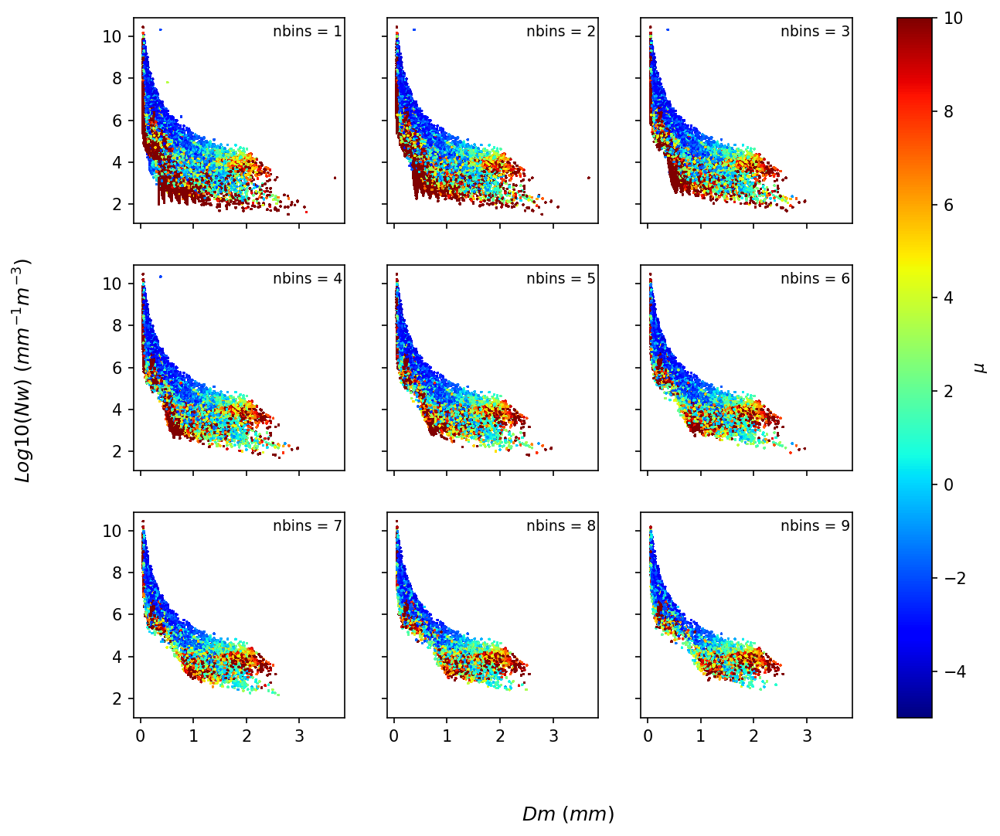

In [16]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['dm'], ls_df[idx]['log10_nw'], c=ls_df[idx]['mu'], cmap='jet', vmin=-5, vmax=10, s=0.1)
    ax.text(2.5, 10, f'nbins = {idx+1 }', fontsize=9)
    
fig.colorbar(sc, ax=axs, label=r'$\mu$')
fig.supxlabel(r'$Dm \ (mm)$', x=0.01)
fig.supylabel(r'$Log10(Nw) \ (mm^{-1} m^{-3})$')


Text(0.02, 0.5, '$Log10(Nw) \\ (mm^{-1} m^{-3})$')

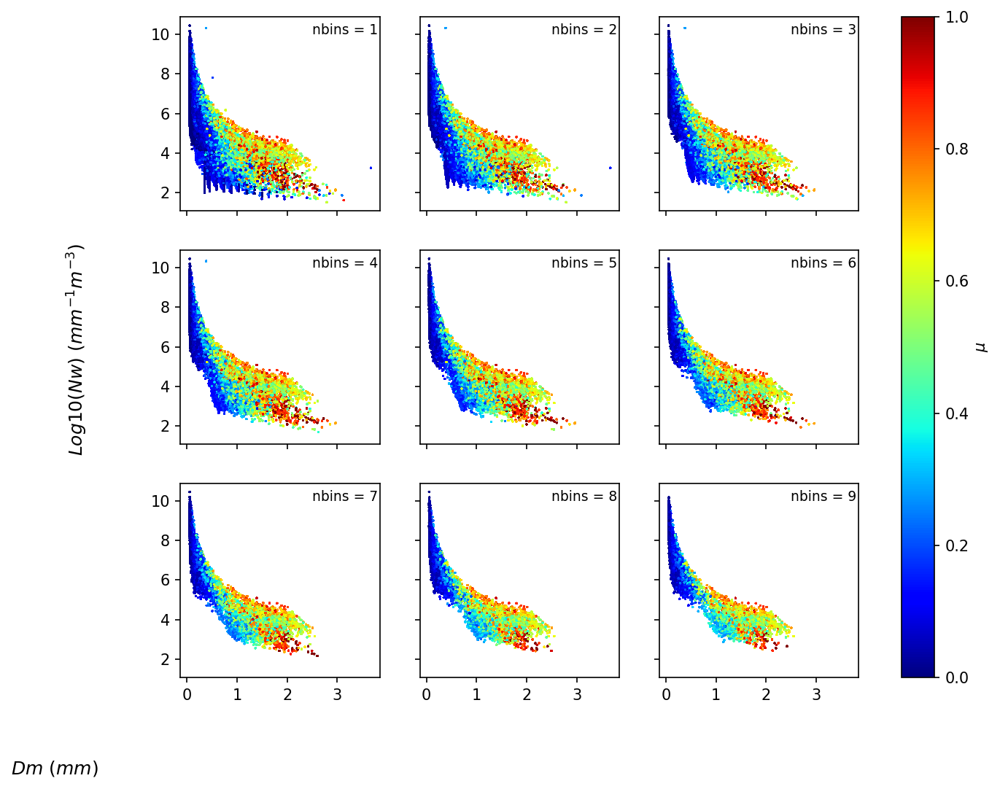

In [39]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['dm'], ls_df[idx]['log10_nw'], c=ls_df[idx]['sigma'], cmap='jet', vmin=0, vmax=1, s=0.1)
    ax.text(2.5, 10, f'nbins = {idx+1 }', fontsize=9)
    
fig.colorbar(sc, ax=axs, label=r'$\sigma$')
fig.supxlabel(r'$Dm \ (mm)$', x=0.01)
fig.supylabel(r'$Log10(Nw) \ (mm^{-1} m^{-3})$')


Text(0.02, 0.5, '$\\sigma)$')

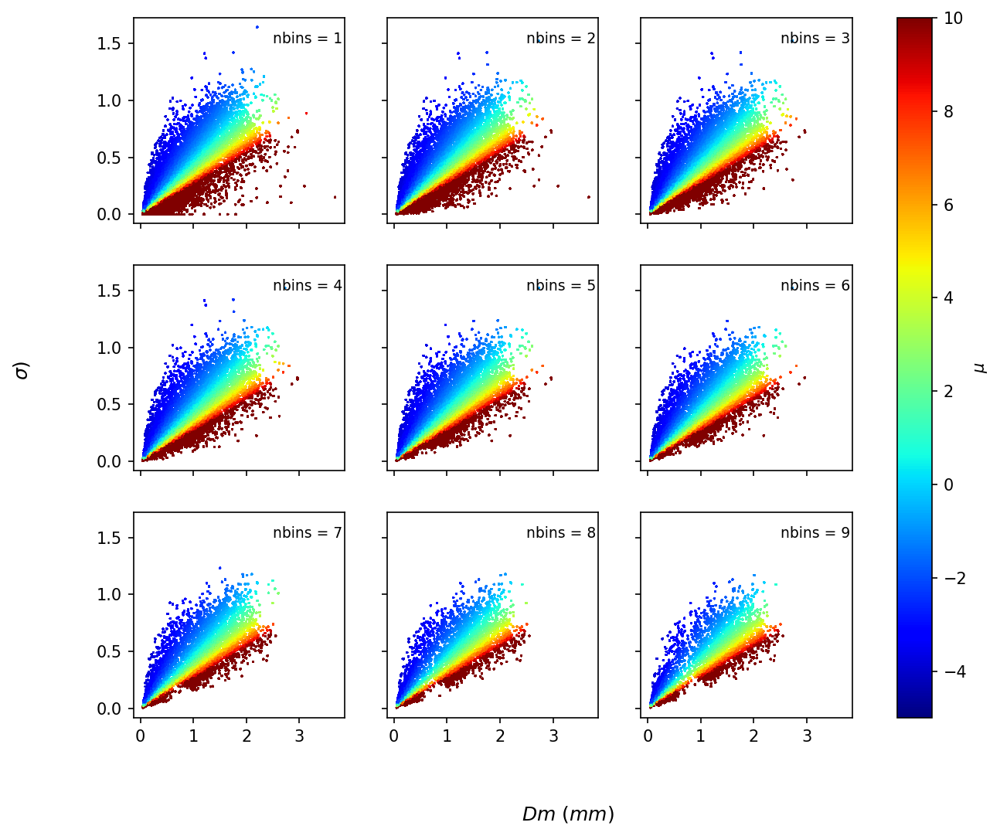

In [19]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['dm'], ls_df[idx]['sigma'], c=ls_df[idx]['mu'], cmap='jet', vmin=-5, vmax=10, s=0.1)
    ax.text(2.5, 1.5, f'nbins = {idx+1 }', fontsize=9)
    
fig.colorbar(sc, ax=axs, label=r'$\mu$')
fig.supxlabel(r'$Dm \ (mm)$')
fig.supylabel(r'$\sigma$')

Text(0.02, 0.5, '$\\mu$')

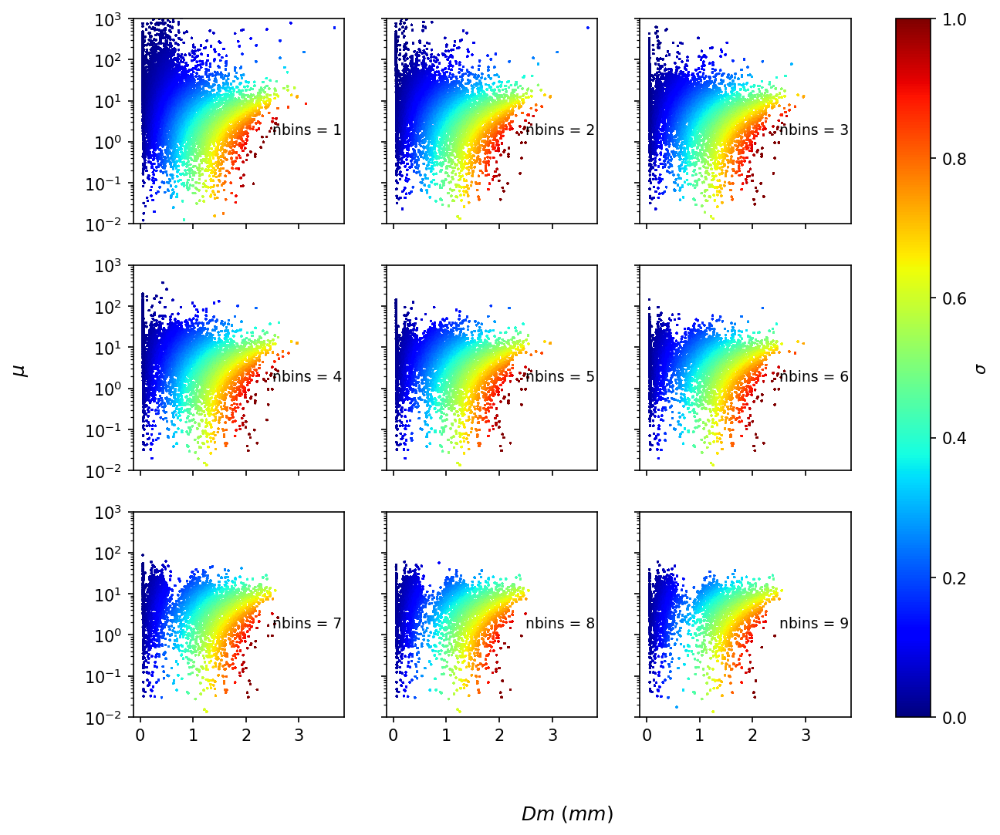

In [29]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['dm'], ls_df[idx]['mu'], c=ls_df[idx]['sigma'], cmap='jet', vmin=0, vmax=1, s=0.1)
    ax.text(2.5, 1.5, f'nbins = {idx+1 }', fontsize=9)
    ax.set_yscale('log')
    ax.set_ylim(1e-2, 1e3)
fig.colorbar(sc, ax=axs, label=r'$\sigma$')
fig.supxlabel(r'$Dm \ (mm)$')
fig.supylabel(r'$\mu$')

Text(0.02, 0.5, '$\\sigma$')

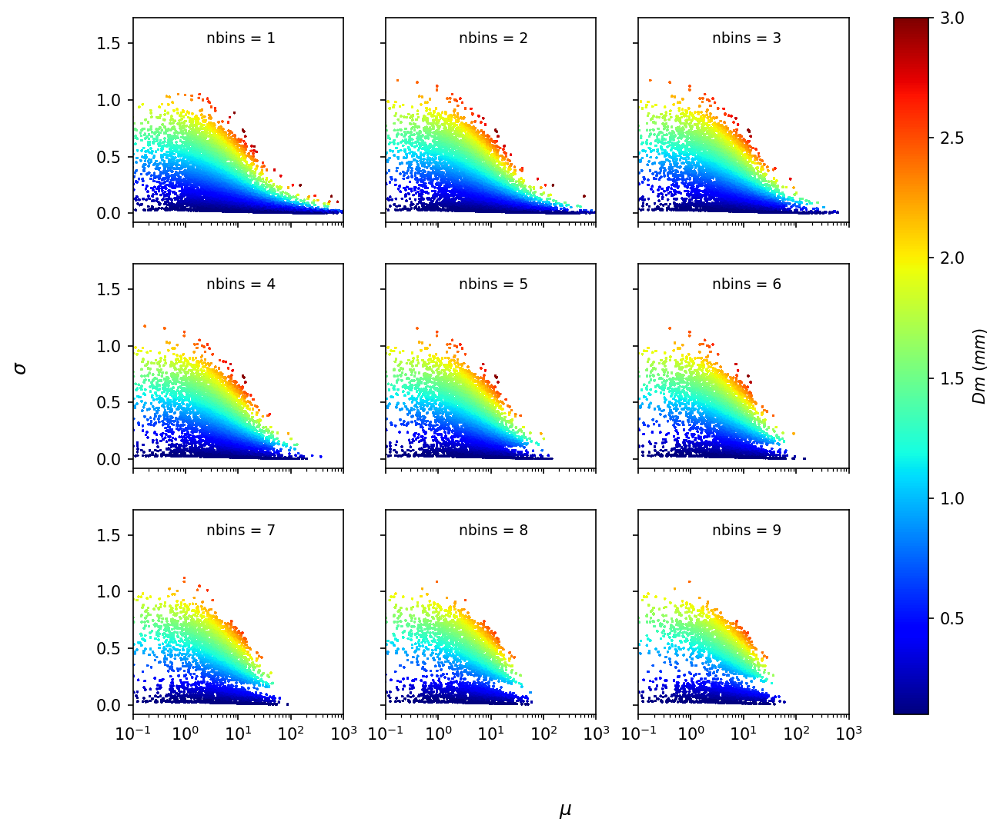

In [33]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['mu'], ls_df[idx]['sigma'], c=ls_df[idx]['dm'], cmap='jet', vmin=0.1, vmax=3, s=0.1)
    ax.text(2.5, 1.5, f'nbins = {idx+1 }', fontsize=9)
    ax.set_xscale('log')
    ax.set_xlim(1e-1, 1e3)
fig.colorbar(sc, ax=axs, label=r'$Dm \ (mm)$')
fig.supxlabel(r'$\mu$')
fig.supylabel(r'$\sigma$')

Text(0.02, 0.5, '$\\mu$')

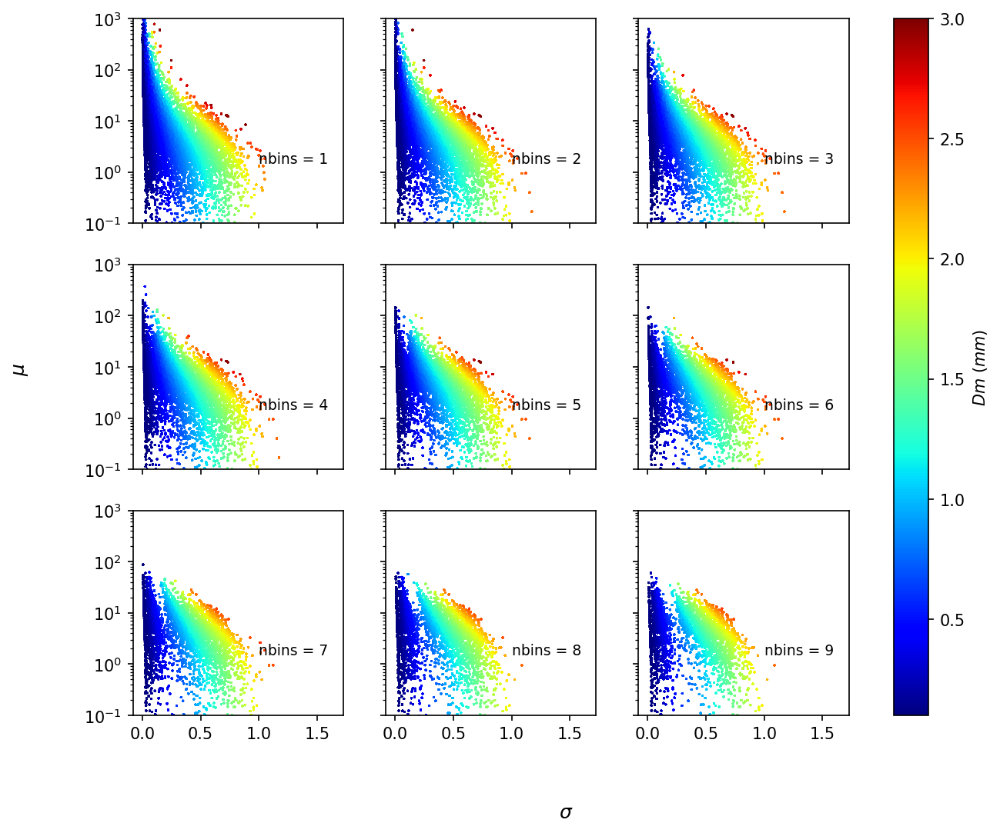

In [36]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['sigma'], ls_df[idx]['mu'], c=ls_df[idx]['dm'], cmap='jet', vmin=0.1, vmax=3, s=0.1)
    ax.text(1, 1.5, f'nbins = {idx+1 }', fontsize=9)
    ax.set_yscale('log')
    ax.set_ylim(1e-1, 1e3)
fig.colorbar(sc, ax=axs, label=r'$Dm \ (mm)$')
fig.supxlabel(r'$\sigma$')
fig.supylabel(r'$\mu$')

Text(0.01, 0.5, '$log10(Nw)$')

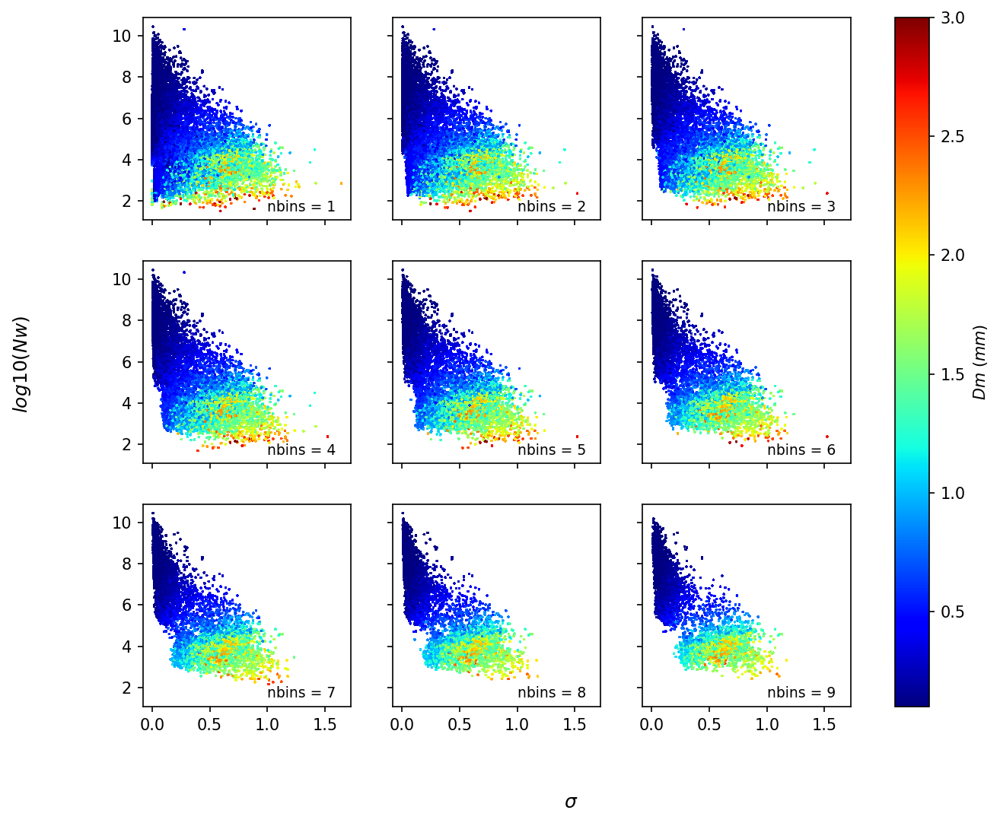

In [38]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['sigma'], ls_df[idx]['log10_nw'], c=ls_df[idx]['dm'], 
                    cmap='jet', vmin=0.1, vmax=3, s=0.1)
    ax.text(1, 1.5, f'nbins = {idx+1 }', fontsize=9)
#     ax.set_yscale('log')
#     ax.set_ylim(1e-1, 1e3)
fig.colorbar(sc, ax=axs, label=r'$Dm \ (mm)$')
fig.supxlabel(r'$\sigma$')
fig.supylabel(r'$log10(Nw)$', x=0.01)

Text(0.01, 0.5, '$log10(Nw)$')

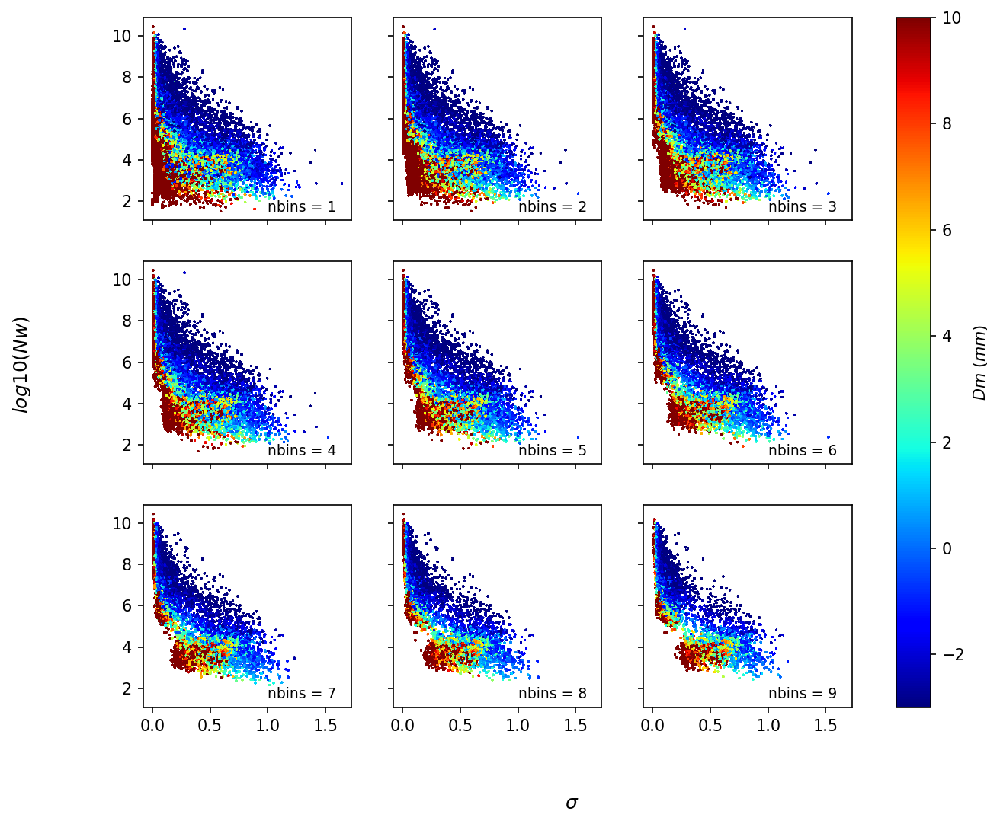

In [42]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['sigma'], ls_df[idx]['log10_nw'], c=ls_df[idx]['mu'], 
                    cmap='jet', vmin=-3, vmax=10, s=0.1)
    ax.text(1, 1.5, f'nbins = {idx+1 }', fontsize=9)
#     ax.set_yscale('log')
#     ax.set_ylim(1e-1, 1e3)
fig.colorbar(sc, ax=axs, label=r'$\Mu$')
fig.supxlabel(r'$\sigma$')
fig.supylabel(r'$log10(Nw)$', x=-0.01)

Text(0.02, 0.5, '$Att \\  (dB)$')

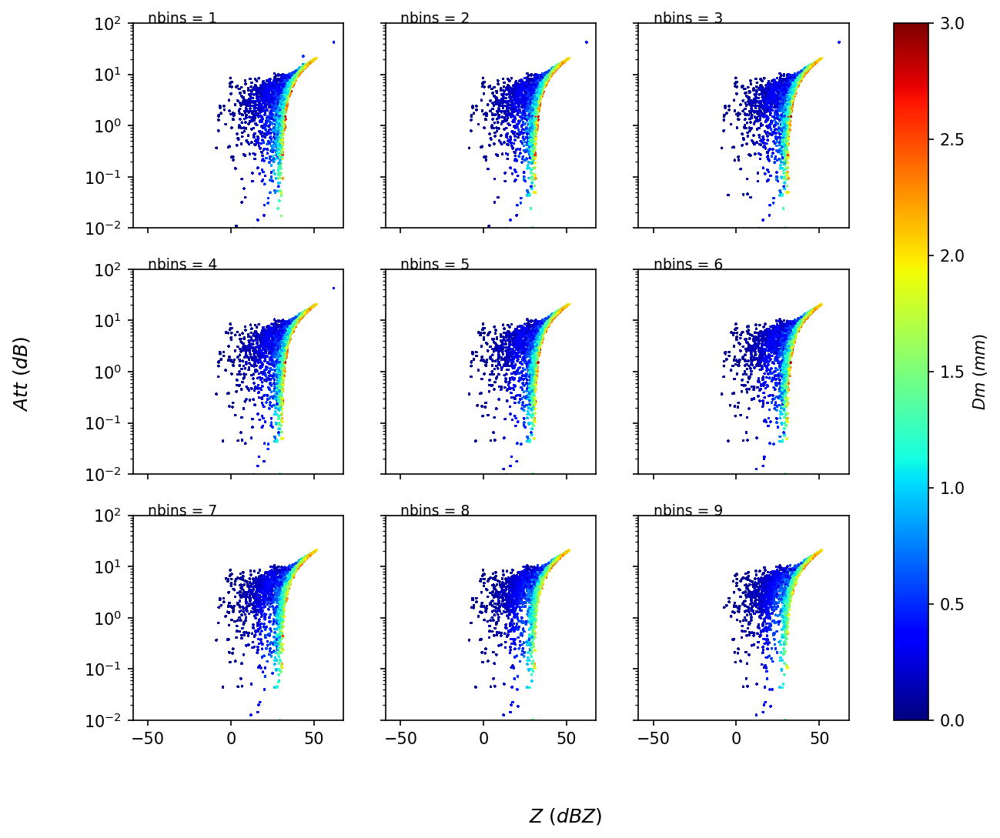

In [43]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['dbz_t_ka'], ls_df[idx]['Att_ka'], c=ls_df[idx]['dm'], cmap='jet', vmin=0, vmax=3, s=0.1)
    ax.text(-50, 100, f'nbins = {idx+1 }', fontsize=9)
    ax.set_yscale('log')
    ax.set_ylim(1e-2, 1e2)
fig.colorbar(sc, ax=axs, label=r'$Dm \ (mm)$')
fig.supxlabel(r'$Z \ (dBZ)$')
fig.supylabel(r'$Att \  (dB)$')

Text(0.02, 0.5, '$Att \\  (dB)$')

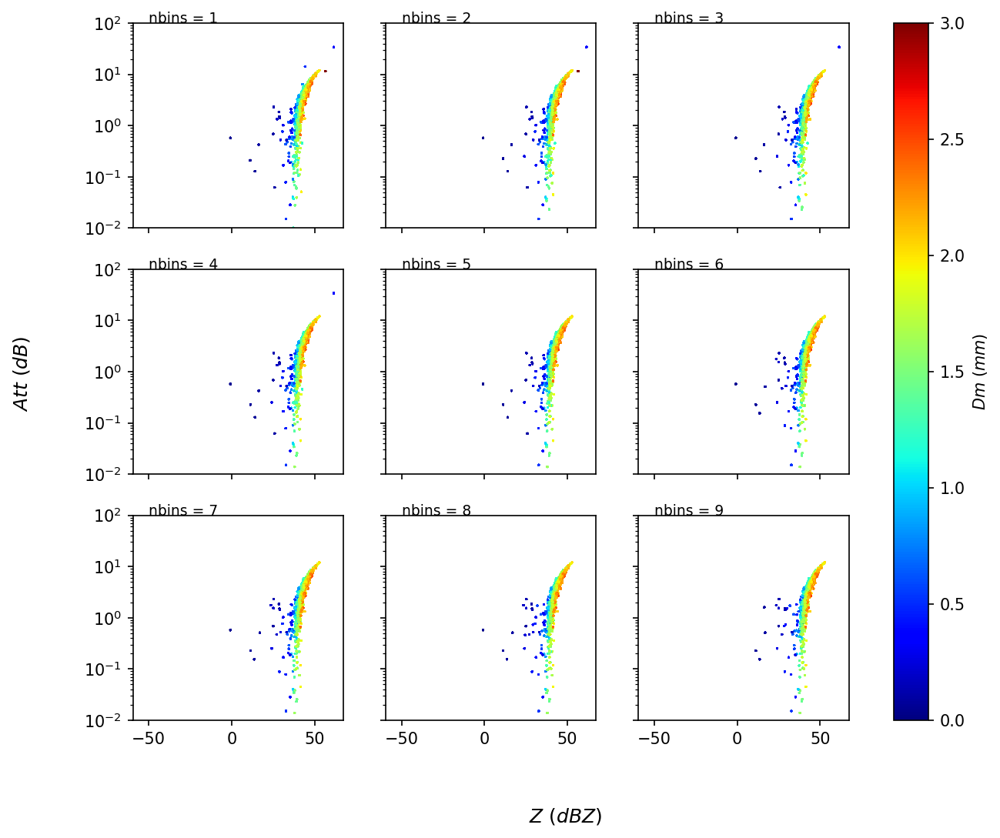

In [44]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['dbz_t_ku'], ls_df[idx]['Att_ku'], c=ls_df[idx]['dm'], cmap='jet', vmin=0, vmax=3, s=0.1)
    ax.text(-50, 100, f'nbins = {idx+1 }', fontsize=9)
    ax.set_yscale('log')
    ax.set_ylim(1e-2, 1e2)
fig.colorbar(sc, ax=axs, label=r'$Dm \ (mm)$')
fig.supxlabel(r'$Z \ (dBZ)$')
fig.supylabel(r'$Att \  (dB)$')

Text(0.02, 0.5, '$Att \\  (dB)$')

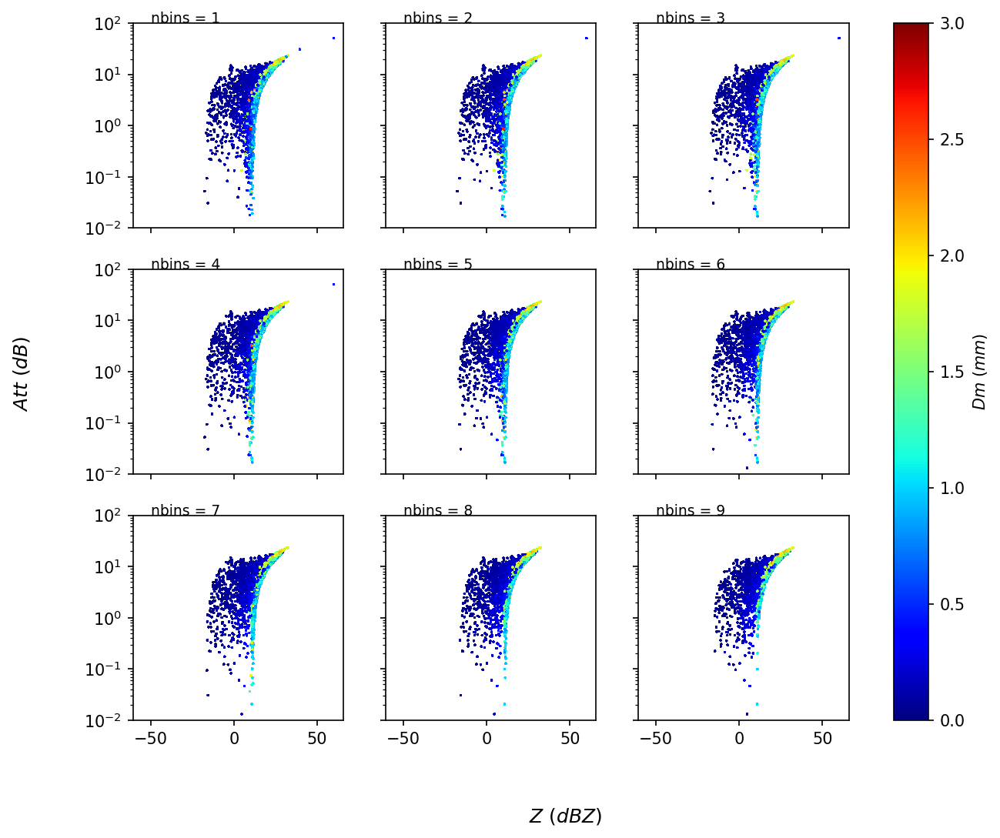

In [45]:
fig, axs = plt.subplots(nrows=3, ncols=3, sharex=True, sharey=True, figsize=(10,8), dpi=150) 
for idx, ax in enumerate(axs.flatten()):
    sc = ax.scatter(ls_df[idx]['dbz_t_w'], ls_df[idx]['Att_w'], c=ls_df[idx]['dm'], cmap='jet', vmin=0, vmax=3, s=0.1)
    ax.text(-50, 100, f'nbins = {idx+1 }', fontsize=9)
    ax.set_yscale('log')
    ax.set_ylim(1e-2, 1e2)
fig.colorbar(sc, ax=axs, label=r'$Dm \ (mm)$')
fig.supxlabel(r'$Z \ (dBZ)$')
fig.supylabel(r'$Att \  (dB)$')